In [1]:
from google.colab import drive
drive.mount('/content/gdrive/')

import os

# !pip install fire
# !pip install tqdm

home_dir = '/content/gdrive/My Drive/A0AKERNEL'
os.chdir(home_dir)
!pwd

import os
# Get the current working directory
current_directory = os.getcwd()
print(current_directory)

import shutil
import os

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).
/content/gdrive/My Drive/A0AKERNEL
/content/gdrive/My Drive/A0AKERNEL


In [2]:
!pip install catboost
!pip install optuna

In [3]:
# imports
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import optuna

from sklearn.model_selection import train_test_split, cross_validate, StratifiedKFold
from sklearn.preprocessing import StandardScaler, QuantileTransformer
from sklearn.ensemble import RandomForestRegressor, VotingRegressor, StackingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.compose import ColumnTransformer
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error
from sklearn.decomposition import PCA
from sklearn.pipeline import FeatureUnion
from sklearn.inspection import PartialDependenceDisplay

from xgboost import XGBRegressor, plot_importance
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor

from imblearn.pipeline import Pipeline
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler, TomekLinks
from imblearn.combine import SMOTETomek

# from cleanlab.classification import CleanLearning

from itertools import combinations

In [4]:
!ls

 catboost_info		    'Copy of Untitled0.ipynb'   KERNEL_initial.ipynb   test.csv   train.csv
'Copy1 of Untitled0.ipynb'   data.npz		        kernel_test.docx       test.npz   train.npz


In [5]:
import pandas as pd

In [6]:
##### LOAD TRAIN/TEST DATEST AND COMBINE THEM.

train = pd.read_csv('train.csv')
train['Dataset'] = 'train'
# Reorder columns to have 'train' at the first position
train = train[['Dataset'] + [col for col in train.columns if col != 'Dataset']]
display(train)

test = pd.read_csv('test.csv')
test['Dataset'] = 'test'
# Reorder columns to have 'train' at the first position
test = test[['Dataset'] + [col for col in test.columns if col != 'Dataset']]

display(test)

data = pd.concat([train, test], axis=0)
data = data.reset_index(drop=True)

display(data)

# fn

,Dataset,Field,Year,Cluster,Area,Yield,Geozone,Predecessor,FAO,N_kg/ga,...,30_week_ndvi,31_week_ndvi,32_week_ndvi,33_week_ndvi,34_week_ndvi,35_week_ndvi,36_week_ndvi,37_week_ndvi,38_week_ndvi,39_week_ndvi
0,train,1310,2019,1,79.263,129.077355,12,0,320.0,222.330633,...,0.757000,0.760333,0.69800,0.66100,0.601000,0.538000,0.4710,0.402333,0.347375,0.343000
1,train,1315,2018,1,115.484,190.068235,12,0,360.0,202.932162,...,0.734968,0.734000,0.73625,0.71400,0.683000,0.624429,0.5905,0.511000,0.463333,0.410000
2,train,1315,2019,1,83.883,149.674818,12,0,320.0,229.686158,...,0.693000,0.664300,0.66600,0.62300,0.578000,0.508000,0.4380,0.366667,0.333125,0.325000
3,train,1312,2018,1,55.964,181.336145,12,0,360.0,209.345544,...,0.751783,0.737000,0.73500,0.70950,0.680750,0.646286,0.6115,0.540000,0.476000,0.405000
4,train,1312,2019,1,55.965,148.165017,12,0,320.0,204.983972,...,0.735000,0.715300,0.67900,0.66500,0.630000,0.569000,0.5010,0.460714,0.399500,0.387000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5729,train,292,2017,6,67.750,44.508800,19,3,310.0,198.125290,...,0.645000,0.591000,0.50400,0.41925,0.363286,0.333143,0.3340,0.341500,0.346000,0.341000
5730,train,291,2017,6,34.610,49.282400,19,3,320.0,199.936302,...,0.670000,0.595000,0.53500,0.37160,0.357000,0.334714,0.3190,0.296000,0.299000,0.298000
5731,train,300,2017,6,30.340,48.486800,19,3,310.0,198.791777,...,0.667000,0.645000,0.59600,0.50780,0.467500,0.427333,0.4200,0.387833,0.372667,0.370000
5732,train,293,2017,6,43.850,35.180000,19,3,400.0,238.239117,...,0.675000,0.598000,0.50600,0.34200,0.298000,0.271286,0.2735,0.251000,0.243333,0.233000


,Dataset,Field,Year,Cluster,Area,Yield,Geozone,Predecessor,FAO,N_kg/ga,...,30_week_ndvi,31_week_ndvi,32_week_ndvi,33_week_ndvi,34_week_ndvi,35_week_ndvi,36_week_ndvi,37_week_ndvi,38_week_ndvi,39_week_ndvi
0,test,1319,2020,1,133.597,0,12,2,320.0,228.438079,...,0.760000,0.72775,0.735000,0.714167,0.70900,0.693333,0.672,0.581000,0.476,0.0
1,test,1332,2020,1,36.319,0,12,2,320.0,206.264848,...,0.768333,0.73200,0.725333,0.723167,0.72200,0.675600,0.663,0.601000,0.487,0.0
2,test,1320,2020,1,147.929,0,12,2,320.0,220.018036,...,0.746000,0.74350,0.726000,0.721000,0.69000,0.694000,0.661,0.545000,0.474,0.0
3,test,1321,2020,1,127.627,0,12,2,320.0,210.685137,...,0.765500,0.74500,0.721333,0.720800,0.72240,0.690000,0.683,0.551000,0.480,0.0
4,test,1322,2020,1,82.478,0,12,2,350.0,196.018720,...,0.740000,0.71325,0.706333,0.706333,0.69800,0.641800,0.630,0.554000,0.447,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2187,test,2743,2020,6,30.444,0,25,0,NaN,170.663185,...,0.600800,0.53400,0.502000,0.424000,0.43200,0.413000,0.403,0.349000,0.293,0.0
2188,test,3002,2020,5,102.733,0,42,1,320.0,106.382623,...,0.637500,0.55500,0.485000,0.418000,0.33200,0.275500,0.263,0.259000,0.212,0.0
2189,test,3000,2020,5,111.347,0,42,1,320.0,100.968073,...,0.592000,0.55550,0.488571,0.406000,0.32425,0.257500,0.247,0.245333,0.220,0.0
2190,test,3001,2020,5,152.212,0,42,1,320.0,103.299175,...,0.648500,0.56575,0.495714,0.420000,0.32525,0.269000,0.249,0.244000,0.224,0.0


,Dataset,Field,Year,Cluster,Area,Yield,Geozone,Predecessor,FAO,N_kg/ga,...,30_week_ndvi,31_week_ndvi,32_week_ndvi,33_week_ndvi,34_week_ndvi,35_week_ndvi,36_week_ndvi,37_week_ndvi,38_week_ndvi,39_week_ndvi
0,train,1310,2019,1,79.263,129.077355,12,0,320.0,222.330633,...,0.757000,0.760333,0.698000,0.6610,0.60100,0.538000,0.4710,0.402333,0.347375,0.343
1,train,1315,2018,1,115.484,190.068235,12,0,360.0,202.932162,...,0.734968,0.734000,0.736250,0.7140,0.68300,0.624429,0.5905,0.511000,0.463333,0.410
2,train,1315,2019,1,83.883,149.674818,12,0,320.0,229.686158,...,0.693000,0.664300,0.666000,0.6230,0.57800,0.508000,0.4380,0.366667,0.333125,0.325
3,train,1312,2018,1,55.964,181.336145,12,0,360.0,209.345544,...,0.751783,0.737000,0.735000,0.7095,0.68075,0.646286,0.6115,0.540000,0.476000,0.405
4,train,1312,2019,1,55.965,148.165017,12,0,320.0,204.983972,...,0.735000,0.715300,0.679000,0.6650,0.63000,0.569000,0.5010,0.460714,0.399500,0.387
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7921,test,2743,2020,6,30.444,0.000000,25,0,NaN,170.663185,...,0.600800,0.534000,0.502000,0.4240,0.43200,0.413000,0.4030,0.349000,0.293000,0.000
7922,test,3002,2020,5,102.733,0.000000,42,1,320.0,106.382623,...,0.637500,0.555000,0.485000,0.4180,0.33200,0.275500,0.2630,0.259000,0.212000,0.000
7923,test,3000,2020,5,111.347,0.000000,42,1,320.0,100.968073,...,0.592000,0.555500,0.488571,0.4060,0.32425,0.257500,0.2470,0.245333,0.220000,0.000
7924,test,3001,2020,5,152.212,0.000000,42,1,320.0,103.299175,...,0.648500,0.565750,0.495714,0.4200,0.32525,0.269000,0.2490,0.244000,0.224000,0.000


In [7]:

# Extract unique cols for _YEARLY_median_
MONTH_YEARLY_median_ = data.columns.str.extract(r'^(.*?)_YEARLY_median_')[0].unique()
_YEARLY_median_FEATURE = data.columns.str.extract(r'_YEARLY_median_(.*)$')[0].unique()

MONTH_YEARLY_median_ = MONTH_YEARLY_median_[1:]
_YEARLY_median_FEATURE = _YEARLY_median_FEATURE[1:]
print("Unique MONTH_YEARLY_median_ values:", MONTH_YEARLY_median_)
print("Unique _YEARLY_median_FEATURE values:", _YEARLY_median_FEATURE)

# Extract unique cols for _YEARLY_sum_
MONTH_YEARLY_sum_ = data.columns.str.extract(r'^(.*?)_YEARLY_sum_')[0].unique()
_YEARLY_sum_FEATURE = data.columns.str.extract(r'_YEARLY_sum_(.*)$')[0].unique()

MONTH_YEARLY_sum_ = MONTH_YEARLY_sum_[1:]
_YEARLY_sum_FEATURE = _YEARLY_sum_FEATURE[1:]
print("Unique MONTH_YEARLY_sum_ values:", MONTH_YEARLY_sum_)
print("Unique _YEARLY_sum_FEATURE values:", _YEARLY_sum_FEATURE)

Unique MONTH_YEARLY_median_ values: ['5' '6' '7' '8' '9']
Unique _YEARLY_median_FEATURE values: ['AVERAGE_TEMPERATURE' 'EVAPORATION' 'HUMIDITY(%)']
Unique MONTH_YEARLY_sum_ values: ['5' '6' '7' '8' '9']
Unique _YEARLY_sum_FEATURE values: ['CALCULATED_RADIATION' 'RAINFALL']


In [8]:
# Extract unique cols for XX_WEEK_FEATURE
XX_WEEK_ = data.columns.str.extract(r'^(.*?)_WEEK_')[0].unique()
_WEEK_FEATURE = data.columns.str.extract(r'_WEEK_(.*)$')[0].unique()

XX_WEEK_ = XX_WEEK_[1:]
_WEEK_FEATURE = _WEEK_FEATURE[1:]
print("Unique MONTH_WEEK_ values:", XX_WEEK_)
print("Unique _WEEK_FEATURE values:", _WEEK_FEATURE)

Unique MONTH_WEEK_ values: ['22' '23' '24' '25' '26' '27' '28' '29' '30' '31' '32' '33' '34' '35'
 '36' '37' '38' '39']
Unique _WEEK_FEATURE values: ['AVERAGE_TEMPERATURE' 'CALCULATED_RADIATION' 'EVAPORATION' 'HUMIDITY(%)'
 'RAINFALL' 'SUM_ACTIVE_TEMPERATURE']


In [9]:
# Convert DataFrame to dictionary
# Create a dictionary to store results

def dataframe_todict(df):
    result_dict = {}

    # Iterate through the original DataFrame
    for _, row in df.iterrows():
        row_dict = {'Dataset': str(row['Dataset']), 'Field': int(row['Field']), 'Year': int(row['Year']), 'Cluster': int(row['Cluster']), 'Area': row['Area'], \
                    'Yield': row['Yield'], 'Geozone': int(row['Geozone']), 'Predecessor': int(row['Predecessor']), 'FAO': row['FAO'], \
                    'N_kg/ga': row['N_kg/ga'], 'P_kg/ga': row['P_kg/ga'], 'K_kg/ga': row['K_kg/ga']}
        ##### FOR YEARLY_median_
        for feature_name in _YEARLY_median_FEATURE:
            feature_key = f'YEARLY_median_{feature_name}'
            feature_values = [row[f'{month}_YEARLY_median_{feature_name}'] for month in MONTH_YEARLY_median_]
            row_dict[feature_key] = feature_values
        ##### FOR YEARLY_sum_
        for feature_name in _YEARLY_sum_FEATURE:
            feature_key = f'YEARLY_sum_{feature_name}'
            feature_values = [row[f'{month}_YEARLY_sum_{feature_name}'] for month in MONTH_YEARLY_sum_]
            row_dict[feature_key] = feature_values
        ##### _WEEK_FEATURE_
        for feature_name in _WEEK_FEATURE:
            feature_key = f'WEEK_{feature_name}'
            feature_values = [row[f'{month}_WEEK_{feature_name}'] for month in XX_WEEK_]
            row_dict[feature_key] = feature_values

        result_dict[_] = row_dict

    return result_dict

data_dict = dataframe_todict(data)

print(data_dict[0])

# fn

{'Dataset': 'train', 'Field': 1310, 'Year': 2019, 'Cluster': 1, 'Area': 79.263, 'Yield': 129.07735513417356, 'Geozone': 12, 'Predecessor': 0, 'FAO': 320.0, 'N_kg/ga': 222.33063346075727, 'P_kg/ga': 52.23912796639037, 'K_kg/ga': 51.22781121077932, 'YEARLY_median_AVERAGE_TEMPERATURE': [15.271015, 18.9521645, 20.720288, 20.079206, 14.8247285], 'YEARLY_median_EVAPORATION': [3.34, 3.805, 3.83, 3.23, 2.01], 'YEARLY_median_HUMIDITY(%)': [65.0, 67.0, 67.0, 65.0, 71.0], 'YEARLY_sum_CALCULATED_RADIATION': [9779661.0, 10016516.0, 10183113.0, 8751805.0, 6020978.0], 'YEARLY_sum_RAINFALL': [804.3799999999997, 1084.3299999999997, 816.0499999999997, 647.0200000000002, 572.2300000000001], 'WEEK_AVERAGE_TEMPERATURE': [19.47, 20.34, 24.26, 22.86, 22.59, 20.0, 16.39, 17.93, 20.52, 18.74, 20.63, 18.66, 21.54, 21.74, 19.0, 18.5, 10.88, 12.5], 'WEEK_CALCULATED_RADIATION': [104599.0, 117513.0, 132875.0, 120769.0, 121579.0, 124775.0, 110394.0, 128496.0, 116607.0, 108613.0, 108217.0, 106751.0, 110187.0, 105787.

In [10]:
# Get unique keys from the outer dictionary
unique_keys = set(data_dict[0].keys())

print("Unique Keys:", len(unique_keys), unique_keys)

Unique Keys: 23 {'YEARLY_median_HUMIDITY(%)', 'WEEK_AVERAGE_TEMPERATURE', 'Cluster', 'WEEK_HUMIDITY(%)', 'P_kg/ga', 'YEARLY_sum_CALCULATED_RADIATION', 'Field', 'K_kg/ga', 'YEARLY_median_EVAPORATION', 'WEEK_SUM_ACTIVE_TEMPERATURE', 'Yield', 'FAO', 'Predecessor', 'N_kg/ga', 'WEEK_EVAPORATION', 'Year', 'Dataset', 'WEEK_RAINFALL', 'YEARLY_sum_RAINFALL', 'YEARLY_median_AVERAGE_TEMPERATURE', 'Area', 'Geozone', 'WEEK_CALCULATED_RADIATION'}


In [11]:
##### CONVERT TO NDARRAY AND SAVE TO NPZ, may be for NN solution

# Extract unique 'Cluster' values
unique_clusters = set(entry['Cluster'] for entry in data_dict.values() if 'Cluster' in entry)

print("Unique Clusters:", unique_clusters)

def dict_to_array(data_dict, file_name='train.npz'):

    # Convert the dictionary of dictionaries to a list of dictionaries
    train_list = [{'record_id': key, **value} for key, value in data_dict.items()]

    print(train_list[0])

    Dataset = []
    Field = []
    Year = []
    Cluster = []
    Area = []
    Yield = []
    Geozone = []
    Predecessor = []
    FAO = []
    N = []
    P = []
    K = []

    WEEK_CALCULATED_RADIATION = []
    WEEK_SUM_ACTIVE_TEMPERATURE = []
    WEEK_HUMIDITY = []
    WEEK_EVAPORATION = []
    WEEK_RAINFALL = []
    WEEK_AVERAGE_TEMPERATURE = []

    YEARLY_median_HUMIDITY = []
    YEARLY_sum_CALCULATED_RADIATION = []
    YEARLY_median_AVERAGE_TEMPERATURE = []
    YEARLY_sum_RAINFALL = []
    YEARLY_median_EVAPORATION = []

    for ii in range(len(train_list)):
        Dataset.append(train_list[ii]['Dataset'])
        Field.append(train_list[ii]['Field'])
        Year.append(train_list[ii]['Year'])
        Cluster.append(train_list[ii]['Cluster'])
        Area.append(train_list[ii]['Area'])

        Yield.append(train_list[ii]['Yield'])
        Geozone.append(train_list[ii]['Geozone'])
        Predecessor.append(train_list[ii]['Predecessor'])
        FAO.append(train_list[ii]['FAO'])

        N.append(train_list[ii]['N_kg/ga'])
        P.append(train_list[ii]['P_kg/ga'])
        K.append(train_list[ii]['K_kg/ga'])

        WEEK_CALCULATED_RADIATION.append(train_list[ii]['WEEK_CALCULATED_RADIATION'])
        WEEK_SUM_ACTIVE_TEMPERATURE.append(train_list[ii]['WEEK_SUM_ACTIVE_TEMPERATURE'])
        WEEK_HUMIDITY.append(train_list[ii]['WEEK_HUMIDITY(%)'])
        WEEK_EVAPORATION.append(train_list[ii]['WEEK_EVAPORATION'])
        WEEK_RAINFALL.append(train_list[ii]['WEEK_RAINFALL'])
        WEEK_AVERAGE_TEMPERATURE.append(train_list[ii]['WEEK_AVERAGE_TEMPERATURE'])

        YEARLY_median_HUMIDITY.append(train_list[ii]['YEARLY_median_HUMIDITY(%)'])
        YEARLY_median_AVERAGE_TEMPERATURE.append(train_list[ii]['YEARLY_median_AVERAGE_TEMPERATURE'])
        YEARLY_median_EVAPORATION.append(train_list[ii]['YEARLY_median_EVAPORATION'])

        YEARLY_sum_CALCULATED_RADIATION.append(train_list[ii]['YEARLY_sum_CALCULATED_RADIATION'])
        YEARLY_sum_RAINFALL.append(train_list[ii]['YEARLY_sum_RAINFALL'])

    print(Field)

    import numpy as np

    np.savez(
        file_name,

        Dataset=np.array(Dataset),
        Field=np.array(Field),
        Year=np.array(Year),
        Cluster=np.array(Cluster),
        Area=np.array(Area),

        Yield=np.array(Yield),
        Geozone=np.array(Geozone),
        Predecessor=np.array(Predecessor),
        FAO=np.array(FAO),

        N=np.array(N),
        P=np.array(P),
        K=np.array(K),

        WEEK_CALCULATED_RADIATION=np.stack(WEEK_CALCULATED_RADIATION),
        WEEK_SUM_ACTIVE_TEMPERATURE=np.stack(WEEK_SUM_ACTIVE_TEMPERATURE),
        WEEK_HUMIDITY=np.stack(WEEK_HUMIDITY),
        WEEK_EVAPORATION=np.stack(WEEK_EVAPORATION),
        WEEK_RAINFALL=np.stack(WEEK_RAINFALL),
        WEEK_AVERAGE_TEMPERATURE=np.stack(WEEK_AVERAGE_TEMPERATURE),

        YEARLY_median_HUMIDITY=np.stack(YEARLY_median_HUMIDITY),
        YEARLY_median_AVERAGE_TEMPERATURE=np.stack(YEARLY_median_AVERAGE_TEMPERATURE),
        YEARLY_median_EVAPORATION=np.stack(YEARLY_median_EVAPORATION),
        YEARLY_sum_CALCULATED_RADIATION=np.stack(YEARLY_sum_CALCULATED_RADIATION),
        YEARLY_sum_RAINFALL=np.stack(YEARLY_sum_RAINFALL),

    )

data_dict = dataframe_todict(data)
dict_to_array(data_dict, 'data.npz')

# test = pd.read_csv('test.csv')
# # test.head()
# test_dict = dataframe_todict(test)
# dict_to_array(test_dict, 'test.npz')

Unique Clusters: {0, 1, 2, 3, 4, 5, 6}
{'record_id': 0, 'Dataset': 'train', 'Field': 1310, 'Year': 2019, 'Cluster': 1, 'Area': 79.263, 'Yield': 129.07735513417356, 'Geozone': 12, 'Predecessor': 0, 'FAO': 320.0, 'N_kg/ga': 222.33063346075727, 'P_kg/ga': 52.23912796639037, 'K_kg/ga': 51.22781121077932, 'YEARLY_median_AVERAGE_TEMPERATURE': [15.271015, 18.9521645, 20.720288, 20.079206, 14.8247285], 'YEARLY_median_EVAPORATION': [3.34, 3.805, 3.83, 3.23, 2.01], 'YEARLY_median_HUMIDITY(%)': [65.0, 67.0, 67.0, 65.0, 71.0], 'YEARLY_sum_CALCULATED_RADIATION': [9779661.0, 10016516.0, 10183113.0, 8751805.0, 6020978.0], 'YEARLY_sum_RAINFALL': [804.3799999999997, 1084.3299999999997, 816.0499999999997, 647.0200000000002, 572.2300000000001], 'WEEK_AVERAGE_TEMPERATURE': [19.47, 20.34, 24.26, 22.86, 22.59, 20.0, 16.39, 17.93, 20.52, 18.74, 20.63, 18.66, 21.54, 21.74, 19.0, 18.5, 10.88, 12.5], 'WEEK_CALCULATED_RADIATION': [104599.0, 117513.0, 132875.0, 120769.0, 121579.0, 124775.0, 110394.0, 128496.0, 11

In [12]:
###### CHECK NPZ
np_data = np.load('data.npz')
sorted(np_data.files)

print(np_data['Field'][0])
print(np_data['Dataset'][0])
print(np_data['WEEK_AVERAGE_TEMPERATURE'][0])
print(type(np_data), len(np_data), type(np_data['WEEK_AVERAGE_TEMPERATURE']), np_data['WEEK_AVERAGE_TEMPERATURE'].shape, type(np_data['WEEK_AVERAGE_TEMPERATURE'][0]), np_data['WEEK_AVERAGE_TEMPERATURE'][0].shape)



1310
train
[19.47 20.34 24.26 22.86 22.59 20.   16.39 17.93 20.52 18.74 20.63 18.66
 21.54 21.74 19.   18.5  10.88 12.5 ]
<class 'numpy.lib.npyio.NpzFile'> 23 <class 'numpy.ndarray'> (7926, 18) <class 'numpy.ndarray'> (18,)


WEEK_AVERAGE_TEMPERATURE shape is (7926, 5)
WEEK_RAINFALL shape is (7926, 13)
WEEK_EVAPORATION shape is (7926, 5)
WEEK_HUMIDITY shape is (7926, 8)
WEEK_SUM_ACTIVE_TEMPERATURE shape is (7926, 4)
WEEK_CALCULATED_RADIATION shape is (7926, 6)
YEARLY_median_HUMIDITY shape is (7926, 5)
YEARLY_median_AVERAGE_TEMPERATURE shape is (7926, 5)
YEARLY_median_EVAPORATION shape is (7926, 5)
YEARLY_sum_CALCULATED_RADIATION shape is (7926, 5)
YEARLY_sum_RAINFALL shape is (7926, 5)


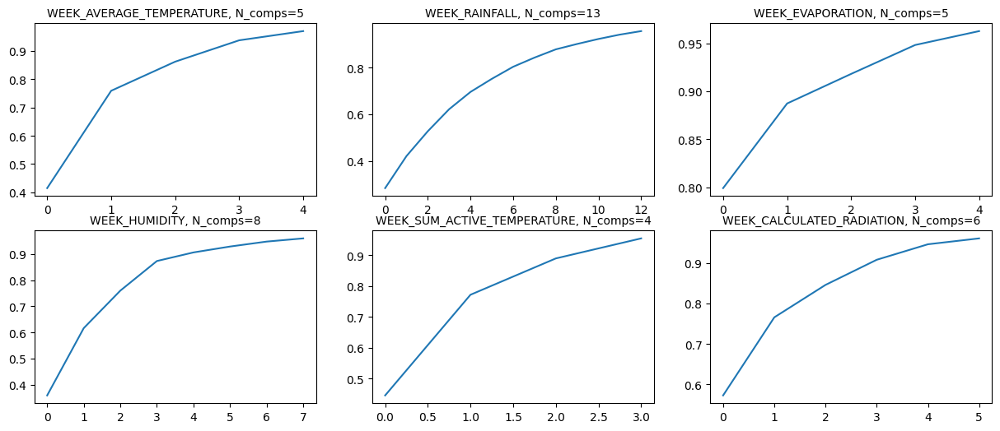

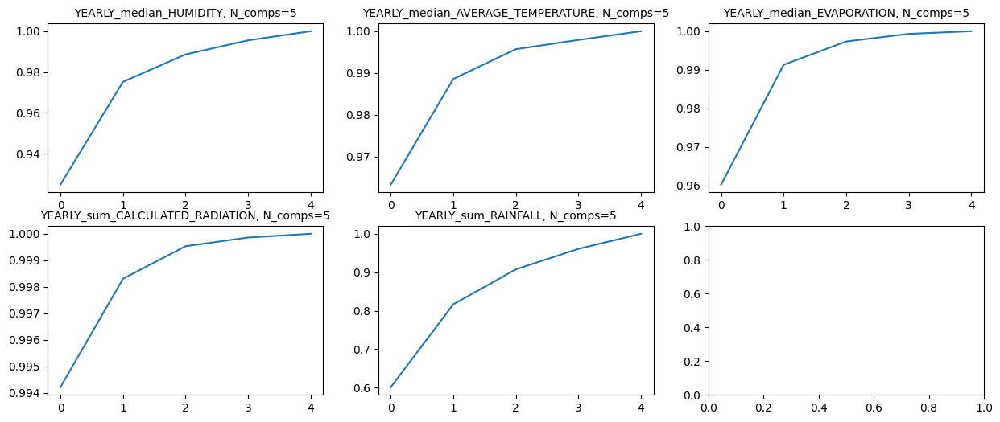

In [13]:
from sklearn.decomposition import PCA

def get_PCA(data, ax, str='', threshold=0.95):
  # Initialize PCA without specifying the number of components
  pca = PCA()


  # Fit PCA to the data
  pca.fit(data)

  # # Plot explained variance ratio
  # ax.plot(np.cumsum(pca.explained_variance_ratio_))
  # plt.xlabel('Number of Components')
  # plt.ylabel('Cumulative Explained Variance')
  # plt.show()

  # Determine the number of components based on the explained variance
  cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
  num_components = np.argmax(cumulative_variance >= threshold) + 1

  # Use the determined number of components
  pca = PCA(n_components=num_components)
  transformed_data = pca.fit_transform(data)

  if num_components > 1:
    sns.lineplot(data=np.cumsum(pca.explained_variance_ratio_), ax=ax).set_title(f'{str}, N_comps={num_components}', fontsize=10);
  else:
    sns.scatterplot(data=np.cumsum(pca.explained_variance_ratio_), ax=ax).set_title(f'{str}, N_comps={num_components}', fontsize=10);

  return transformed_data

######## FOR DIMENSION REDUCING ##########################
def get_EOF_DATA_LIST(np_train):
    ###############

    fix, ax = plt.subplots(2, 3, figsize=(15, 6))
    axs = ax.flat

    week_feature_name_list = ['WEEK_AVERAGE_TEMPERATURE', 'WEEK_RAINFALL', 'WEEK_EVAPORATION', 'WEEK_HUMIDITY', 'WEEK_SUM_ACTIVE_TEMPERATURE', 'WEEK_CALCULATED_RADIATION']

    pc_WEEK_FEATURE_list = []
    for ii, feature_name in enumerate(week_feature_name_list):
      data = np_train[week_feature_name_list[ii]]
      pc_WEEK_FEATURE_list.append(get_PCA(data, axs[ii], feature_name))
      print(f'{feature_name} shape is {pc_WEEK_FEATURE_list[ii].shape}')

    #############

    fix, ax = plt.subplots(2, 3, figsize=(15, 6))
    axs = ax.flat

    yearly_feature_name_list = ['YEARLY_median_HUMIDITY', 'YEARLY_median_AVERAGE_TEMPERATURE', 'YEARLY_median_EVAPORATION', 'YEARLY_sum_CALCULATED_RADIATION', 'YEARLY_sum_RAINFALL']

    pc_YEARLY_FEATURE_list = []
    for ii, feature_name in enumerate(yearly_feature_name_list):
      data = np_train[yearly_feature_name_list[ii]]
      pc_YEARLY_FEATURE_list.append(get_PCA(data, axs[ii], feature_name, threshold=0.99999999))
      print(f'{feature_name} shape is {pc_YEARLY_FEATURE_list[ii].shape}')


    WEATHER_FEATURE_NAME_LIST = week_feature_name_list + yearly_feature_name_list
    pc_WEATHER_FEATURE_LIST   = pc_WEEK_FEATURE_list + pc_YEARLY_FEATURE_list

    return WEATHER_FEATURE_NAME_LIST, pc_WEATHER_FEATURE_LIST

####### FOR PREVENT MULTICOLLINEARITY IN WEATHER DATA #######################
def get_EOF_DATA_LIST_all(np_train):
    ###############

    fix, ax = plt.subplots(figsize=(15, 6))

    week_feature_name_list = ['WEEK_AVERAGE_TEMPERATURE', 'WEEK_RAINFALL', 'WEEK_EVAPORATION', 'WEEK_HUMIDITY', 'WEEK_SUM_ACTIVE_TEMPERATURE', 'WEEK_CALCULATED_RADIATION']

    pc_WEEK_FEATURE_list = []
    data = np_train[week_feature_name_list[0]]
    for ii, feature_name in enumerate(week_feature_name_list[1:]):
        # dt = np_train[week_feature_name_list[ii]]
        # print(dt.shape)
        data = np.concatenate((data, np_train[week_feature_name_list[ii]]), axis=1)     # np_train[week_feature_name_list[ii]]
    print(type(data), data.shape)
    # fn
    pc_WEEK_FEATURE_list.append(get_PCA(data, ax, 'WEEKLY'))
    print(f'{feature_name} shape is {pc_WEEK_FEATURE_list[0].shape}')

    #############

    fix, ax = plt.subplots(figsize=(15, 6))

    yearly_feature_name_list = ['YEARLY_median_HUMIDITY', 'YEARLY_median_AVERAGE_TEMPERATURE', 'YEARLY_median_EVAPORATION', 'YEARLY_sum_CALCULATED_RADIATION', 'YEARLY_sum_RAINFALL']

    pc_YEARLY_FEATURE_list = []
    data = np_train[yearly_feature_name_list[0]]
    for ii, feature_name in enumerate(yearly_feature_name_list[1:]):
        # dt = np_train[yearly_feature_name_list[ii]]
        # print(dt.shape)
        data = np.concatenate((data, np_train[yearly_feature_name_list[ii]]), axis=1)     # np_train[week_feature_name_list[ii]]
    print(type(data), data.shape)
    # fn
    pc_YEARLY_FEATURE_list.append(get_PCA(data, ax, 'YEARLY', threshold=0.99999999))
    print(f'{feature_name} shape is {pc_YEARLY_FEATURE_list[0].shape}')


    WEATHER_FEATURE_NAME_LIST = ['WEEKLY_WEATHER', 'YEARLY_WEATHER'] # week_feature_name_list + yearly_feature_name_list
    pc_WEATHER_FEATURE_LIST   = pc_WEEK_FEATURE_list + pc_YEARLY_FEATURE_list

    return WEATHER_FEATURE_NAME_LIST, pc_WEATHER_FEATURE_LIST

# WEATHER_FEATURE_NAME_LIST, pc_WEATHER_FEATURE_LIST = get_EOF_DATA_LIST_all(np_data)
WEATHER_FEATURE_NAME_LIST, pc_WEATHER_FEATURE_LIST = get_EOF_DATA_LIST(np_data)

# print(len(pc_WEATHER_FEATURE_LIST))
# print(pc_WEATHER_FEATURE_LIST[0].shape, pc_WEATHER_FEATURE_LIST[1].shape)
# print(len(WEATHER_FEATURE_NAME_LIST))
# print(WEATHER_FEATURE_NAME_LIST[0], WEATHER_FEATURE_NAME_LIST[1])



In [14]:
##### CREATE TRAIN/TEST DATASET WITH PCA DECOMPOZITION ################

feature_name_list = ['Dataset', 'Field', 'Year', 'Cluster', 'Area', 'Yield', 'Geozone', 'Predecessor', 'FAO', 'N', 'P', 'K']

data_data = pd.DataFrame([])

for ii, feature_name in enumerate(feature_name_list):
    data = pd.DataFrame(np_data[feature_name], columns=[feature_name])
    data_data = pd.concat([data_data, data], axis=1)

# display(data_data)

for ii, feature_name in enumerate(WEATHER_FEATURE_NAME_LIST):
    print(ii)
    num_cols = pc_WEATHER_FEATURE_LIST[ii].shape[1]   # np_train[feature_name].shape[1]
    cols_names = [f'{feature_name}_{x}' for x in range(num_cols)]
    data = pd.DataFrame(pc_WEATHER_FEATURE_LIST[ii], columns=cols_names)
    data_data = pd.concat([data_data, data], axis=1)

display(data_data)

# for ii, feature_name in enumerate(yearly_feature_name_list):
#     num_cols = pc_YEARLY_FEATURE_list[ii].shape[1]   # np_train[feature_name].shape[1]
#     cols_names = [f'{feature_name}_{x}' for x in range(num_cols)]
#     data = pd.DataFrame(pc_YEARLY_FEATURE_list[ii], columns=cols_names)
#     train_data = pd.concat([train_data, data], axis=1)

# display(train_data)

print(data_data.columns)

# fn

0
1
2
3
4
5
6
7
8
9
10


,Dataset,Field,Year,Cluster,Area,Yield,Geozone,Predecessor,FAO,N,...,YEARLY_sum_CALCULATED_RADIATION_0,YEARLY_sum_CALCULATED_RADIATION_1,YEARLY_sum_CALCULATED_RADIATION_2,YEARLY_sum_CALCULATED_RADIATION_3,YEARLY_sum_CALCULATED_RADIATION_4,YEARLY_sum_RAINFALL_0,YEARLY_sum_RAINFALL_1,YEARLY_sum_RAINFALL_2,YEARLY_sum_RAINFALL_3,YEARLY_sum_RAINFALL_4
0,train,1310,2019,1,79.263,129.077355,12,0,320.0,222.330633,...,-1.818888e+06,36416.933727,96828.719884,1425.671476,-36665.714588,267.025964,65.696857,-24.352449,-2.583870,-49.701393
1,train,1315,2018,1,115.484,190.068235,12,0,360.0,202.932162,...,-1.818888e+06,36416.933727,96828.719883,1425.671476,-36665.714588,267.025964,65.696857,-24.352449,-2.583870,-49.701393
2,train,1315,2019,1,83.883,149.674818,12,0,320.0,229.686158,...,-1.818888e+06,36416.933727,96828.719883,1425.671476,-36665.714588,267.025964,65.696857,-24.352449,-2.583870,-49.701393
3,train,1312,2018,1,55.964,181.336145,12,0,360.0,209.345544,...,-1.818888e+06,36416.933727,96828.719884,1425.671476,-36665.714588,267.025964,65.696857,-24.352449,-2.583870,-49.701393
4,train,1312,2019,1,55.965,148.165017,12,0,320.0,204.983972,...,-1.818888e+06,36416.933727,96828.719884,1425.671476,-36665.714588,267.025964,65.696857,-24.352449,-2.583870,-49.701393
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7921,test,2743,2020,6,30.444,0.000000,25,0,NaN,170.663185,...,-4.572717e+05,143131.497151,59081.895724,70483.093873,16557.420249,-3.492220,-27.613308,-151.090468,-87.815578,82.722257
7922,test,3002,2020,5,102.733,0.000000,42,1,320.0,106.382623,...,8.805778e+06,86008.210415,-18139.945677,-44809.960093,130096.802068,-309.007388,-118.005458,-19.697905,56.440559,-26.447379
7923,test,3000,2020,5,111.347,0.000000,42,1,320.0,100.968073,...,8.805778e+06,86008.210415,-18139.945677,-44809.960093,130096.802068,-309.007388,-118.005458,-19.697905,56.440559,-26.447379
7924,test,3001,2020,5,152.212,0.000000,42,1,320.0,103.299175,...,8.805778e+06,86008.210415,-18139.945677,-44809.960093,130096.802068,-309.007388,-118.005458,-19.697905,56.440559,-26.447379


Index(['Dataset', 'Field', 'Year', 'Cluster', 'Area', 'Yield', 'Geozone',
       'Predecessor', 'FAO', 'N', 'P', 'K', 'WEEK_AVERAGE_TEMPERATURE_0',
       'WEEK_AVERAGE_TEMPERATURE_1', 'WEEK_AVERAGE_TEMPERATURE_2',
       'WEEK_AVERAGE_TEMPERATURE_3', 'WEEK_AVERAGE_TEMPERATURE_4',
       'WEEK_RAINFALL_0', 'WEEK_RAINFALL_1', 'WEEK_RAINFALL_2',
       'WEEK_RAINFALL_3', 'WEEK_RAINFALL_4', 'WEEK_RAINFALL_5',
       'WEEK_RAINFALL_6', 'WEEK_RAINFALL_7', 'WEEK_RAINFALL_8',
       'WEEK_RAINFALL_9', 'WEEK_RAINFALL_10', 'WEEK_RAINFALL_11',
       'WEEK_RAINFALL_12', 'WEEK_EVAPORATION_0', 'WEEK_EVAPORATION_1',
       'WEEK_EVAPORATION_2', 'WEEK_EVAPORATION_3', 'WEEK_EVAPORATION_4',
       'WEEK_HUMIDITY_0', 'WEEK_HUMIDITY_1', 'WEEK_HUMIDITY_2',
       'WEEK_HUMIDITY_3', 'WEEK_HUMIDITY_4', 'WEEK_HUMIDITY_5',
       'WEEK_HUMIDITY_6', 'WEEK_HUMIDITY_7', 'WEEK_SUM_ACTIVE_TEMPERATURE_0',
       'WEEK_SUM_ACTIVE_TEMPERATURE_1', 'WEEK_SUM_ACTIVE_TEMPERATURE_2',
       'WEEK_SUM_ACTIVE_TEMPERATURE_3

In [15]:
 ######## CREATE & CLEAR TRAIN/TEST DATSETS ###############

# import the data
train = data_data[ data_data['Dataset'] == 'train' ]
submission = data_data[ data_data['Dataset'] == 'test' ]

def check_nan_dupl(df):
    # check for missing values
    print('-----------------------------------------------------------------')
    print(f'Dataset length: {df.shape[0]}\n')

    print(f'There are {int(df.isna().sum().sum())} missing feature values.')

    # Identify columns with NaN values
    nan_columns = train.columns[df.isna().any()]
    print(f'There are NaN column names: {nan_columns}\n')

    # check for duplicate rows
    n_duplicate_rows = len(df) - len(df.drop_duplicates())
    print(f'There are {int(n_duplicate_rows)} duplicate rows.\n')

    df = df.dropna()

    df = df.drop_duplicates()

    # get length of train and test datasets
    print(f'Cleared Dataset length: {df.shape[0]}')
    # print(f'Submission dataset length: {submission.shape[0]}\n\n')

    # quick high-level overview of dataset
    # pd.set_option('display.expand_frame_repr', False) # need this because there are so many features
    # pd.set_option('display.max_columns', None)
    # pd.set_option('display.max_rows', None)
    # display(df.head())
    # print('\n\n')
    # display(df.describe().round(decimals=2))
    print('-----------------------------------------------------------------')

    return df

train = check_nan_dupl(train)

submission = check_nan_dupl(submission)

# fn

-----------------------------------------------------------------
Dataset length: 5734

There are 1352 missing feature values.
There are NaN column names: Index(['FAO', 'P', 'K'], dtype='object')

There are 47 duplicate rows.

Cleared Dataset length: 4612
-----------------------------------------------------------------
-----------------------------------------------------------------
Dataset length: 2192

There are 961 missing feature values.
There are NaN column names: Index(['FAO', 'P', 'K'], dtype='object')

There are 0 duplicate rows.

Cleared Dataset length: 1501
-----------------------------------------------------------------


In [16]:
features = ['Field', 'Cluster', 'Area', 'Yield', 'Geozone', 'Predecessor', 'FAO', 'N_kg/ga', 'P_kg/ga', 'K_kg/ga']

import matplotlib.colors as mcolors
import numpy as np
import matplotlib.pyplot as plt

def generate_color_vector(N, majority_color='blue', colormap='viridis'):
    """
    Generate a vector of colors with a majority color using matplotlib.colors.

    Parameters:
    - N: int, dimension of the color vector.
    - majority_color: str or tuple, color code for the majority color.
    - colormap: str, name of the colormap for the other colors.

    Returns:
    - color_vector: list of RGBA values.
    """
    # Create a colormap for the other colors
    cmap = plt.cm.get_cmap(colormap)

    # Generate a vector of colors
    color_vector = [mcolors.to_rgba(majority_color)] * N

    # Add other colors from the colormap
    for i in range(1, N):
        color_vector[i] = cmap(i / (N - 1))

    return color_vector

# Example usage with 45 dimensions, majority color 'blue', and colormap 'viridis'
N_dim = 45
majority_color = 'red'
colormap_name = 'viridis'

colors = generate_color_vector(N_dim, majority_color, colormap_name)

# Display the generated color vector
# print("Color Vector:")
# print(colors)

<ipython-input-16-a6ef23a977ca>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap(colormap)


<ipython-input-17-48ddc6b92014>:15: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=train[ train['Geozone'] == ii ], x='Yield', fill=True, ax=axs[1], color=colors[ii]).set_title('Yield for Geozones');


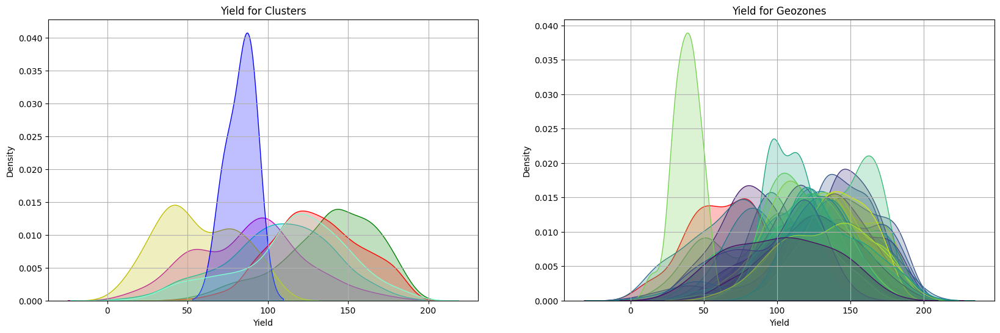

In [17]:
#### CHECK YIELD DISTRIBUTION FOR EACH CLUSTER
colors_clusters = ['r', 'g', 'b', 'm', 'c', 'y', 'aquamarine']

fix, ax = plt.subplots(1, 2, figsize=(20, 6))
axs = ax.flat

for ii in train['Cluster'].unique():
    sns.kdeplot(data=train[ train['Cluster'] == ii ], x='Yield', fill=True, ax=axs[0], color=colors_clusters[ii]).set_title('Yield for Clusters');
# sns.kdeplot(data=train[ train['Cluster'] == 2 ], x='Yield', fill=True, ax=ax, color='r').set_title('Target Distribution on Train Set');
# ax = np.ravel(ax)
axs[0].grid(visible=True)

# fix, ax = plt.subplots(figsize=(6, 6))
for ii in train['Geozone'].unique():
    sns.kdeplot(data=train[ train['Geozone'] == ii ], x='Yield', fill=True, ax=axs[1], color=colors[ii]).set_title('Yield for Geozones');
# sns.kdeplot(data=train[ train['Cluster'] == 2 ], x='Yield', fill=True, ax=ax, color='r').set_title('Target Distribution on Train Set');
# ax = np.ravel(ax)
axs[1].grid(visible=True)

<ipython-input-18-167b97f0f953>:12: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df_f, x=f'Yield', fill=True, ax=axs[jj], color=colors[ii]).set_title(f'Clust: {jj}; Geos: {num_geozone}, Fields: {df.shape[0]}')


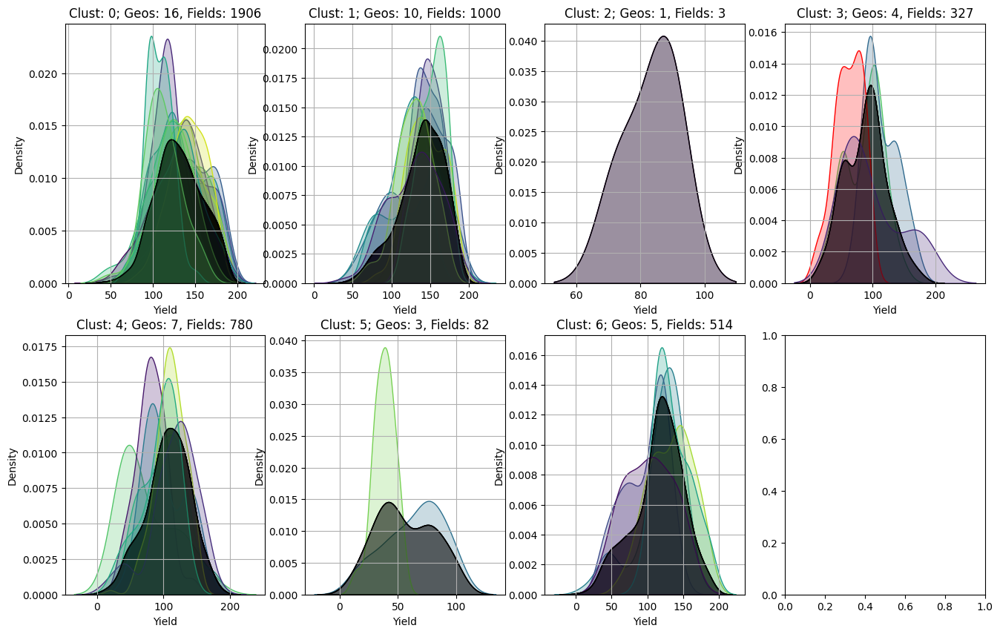

In [18]:
##### CHECK YIELD DISTRIBUTION FOR EACH GEOZONE For EACH CLUSTER
# colors = ['r', 'g', 'b', 'm', 'c', 'y', 'aquamarine']

fix, ax = plt.subplots(2, 4, figsize=(16, 10))
axs = ax.flat
for jj in train['Cluster'].unique():
  df = train[ train['Cluster'] == jj ]
  num_geozone = len(df['Geozone'].unique())
  for ii in df['Geozone'].unique():
      df_f = df[ df['Geozone'] == ii ]
      # print('Cluster:', jj, 'Geozone:', ii, 'Fields', df_f.shape[0])
      sns.kdeplot(data=df_f, x=f'Yield', fill=True, ax=axs[jj], color=colors[ii]).set_title(f'Clust: {jj}; Geos: {num_geozone}, Fields: {df.shape[0]}')
      sns.kdeplot(data=df, x='Yield', fill=True, ax=axs[jj], color='black') #.set_title('Target Distribution on Train Set');
  axs[jj].grid(visible=True)
# sns.kdeplot(data=train[ train['Cluster'] == 2 ], x='Yield', fill=True, ax=ax, color='r').set_title('Target Distribution on Train Set');
# ax = np.ravel(ax)


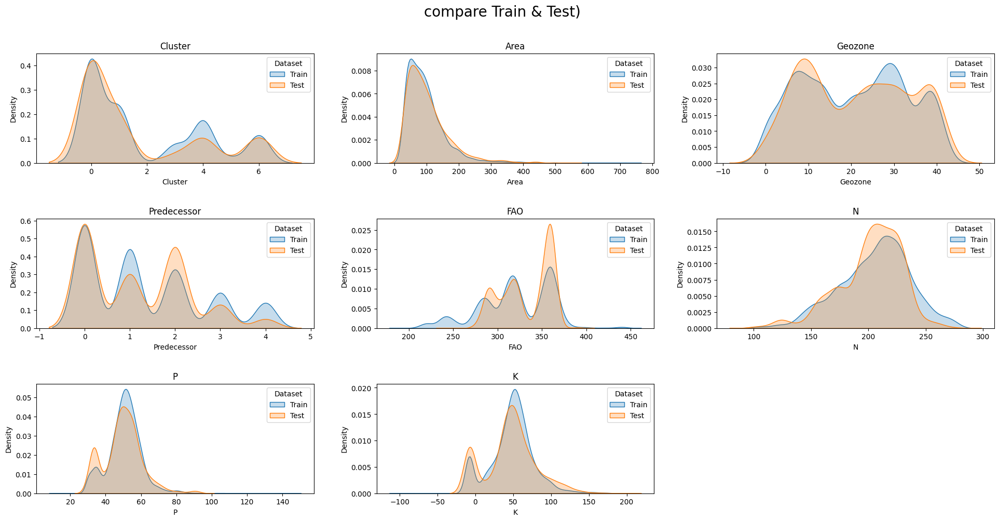

In [19]:
# features = ['Field', 'Cluster', 'Area', 'Geozone', 'Predecessor', 'FAO', 'N_kg/ga', 'P_kg/ga', 'K_kg/ga']
features = ['Cluster', 'Area', 'Geozone', 'Predecessor', 'FAO', 'N', 'P', 'K']

# plotting distribution of each continuous feature in train and test datasets
fig, ax = plt.subplots(6, 3, figsize=(20, 20))
ax = np.ravel(ax)
palette = sns.color_palette('tab10', 2)

for i, col in enumerate(features):
    sns.kdeplot(data=train, x=train[col], ax=ax[i], label='Train', color=palette[0], fill=True)
    sns.kdeplot(data=submission, x=submission[col], ax=ax[i], label='Test', color=palette[1], fill=True)
    ax[i].set_title(f'{col}', fontsize=12)
    ax[i].legend(title='Dataset', loc='upper right', labels=['Train', 'Test'])

fig.suptitle('compare Train & Test)', fontsize=20);
fig.tight_layout(pad=3)
for i in range(len(ax)): # hiding any unused axes
    if i >= len(features):
        ax[i].set_visible(False)

There are 11 extreme outliers in the P _kg/ga feature in the training set.
There are 0 extreme outliers in the P _kg/ga feature in the submission set.

There are 457 extreme outliers in the K _kg/ga feature in the training set.
There are 260 extreme outliers in the K _kg/ga feature in the submission set.



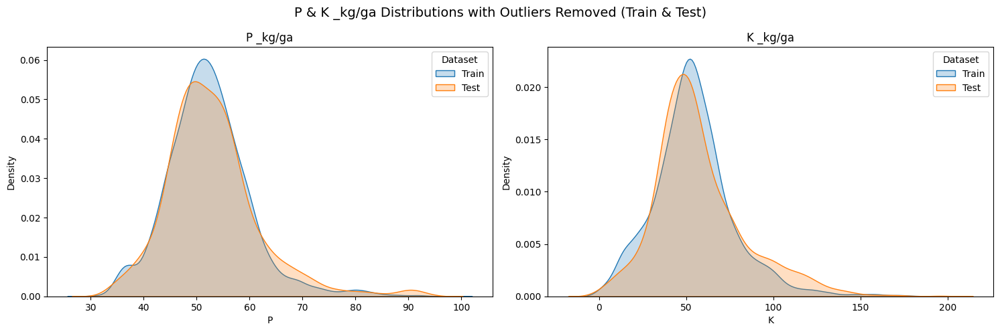

In [20]:
# checking for extreme P & K outliers

P_threshold = 100
n_P_exceeding_train = len(train[train['P'] >= P_threshold])
n_P_exceeding_submission = len(submission[submission['P'] >= P_threshold])
print(f'There are {n_P_exceeding_train} extreme outliers in the P _kg/ga feature in the training set.')
print(f'There are {n_P_exceeding_submission} extreme outliers in the P _kg/ga feature in the submission set.\n')

temp_train = train[train['P'] < P_threshold]
temp_submission = submission[submission['P'] < P_threshold]

# checking for extreme K outliers
K_threshold = 0
n_K_exceeding_train = len(temp_train[temp_train['K'] <= K_threshold])
n_K_exceeding_submission = len(temp_submission[temp_submission['K'] <= K_threshold])
print(f'There are {n_K_exceeding_train} extreme outliers in the K _kg/ga feature in the training set.')
print(f'There are {n_K_exceeding_submission} extreme outliers in the K _kg/ga feature in the submission set.\n')

temp_train = temp_train[temp_train['K'] > K_threshold]
temp_submission = temp_submission[temp_submission['K'] > K_threshold]

# plotting distribution of each continuous feature in train and test datasets
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax = np.ravel(ax)
palette = sns.color_palette('tab10', 2)

sns.kdeplot(data=temp_train, x=temp_train['P'], ax=ax[0], label='Train', color=palette[0], fill=True)
sns.kdeplot(data=temp_submission, x=temp_submission['P'], ax=ax[0], label='Test', color=palette[1], fill=True)
ax[0].set_title(f'P _kg/ga', fontsize=12)
ax[0].legend(title='Dataset', loc='upper right', labels=['Train', 'Test'])

sns.kdeplot(data=temp_train, x=temp_train['K'], ax=ax[1], label='Train', color=palette[0], fill=True)
sns.kdeplot(data=temp_submission, x=temp_submission['K'], ax=ax[1], label='Test', color=palette[1], fill=True)
ax[1].set_title(f'K _kg/ga', fontsize=12)
ax[1].legend(title='Dataset', loc='upper right', labels=['Train', 'Test'])

fig.suptitle('P & K _kg/ga Distributions with Outliers Removed (Train & Test)', fontsize=14);
fig.tight_layout(pad=1)

Index(['Dataset', 'Field', 'Year', 'Cluster', 'Area', 'Yield', 'Geozone',
       'Predecessor', 'FAO', 'N', 'P', 'K', 'WEEK_AVERAGE_TEMPERATURE_0',
       'WEEK_AVERAGE_TEMPERATURE_1', 'WEEK_AVERAGE_TEMPERATURE_2',
       'WEEK_AVERAGE_TEMPERATURE_3', 'WEEK_AVERAGE_TEMPERATURE_4',
       'WEEK_RAINFALL_0', 'WEEK_RAINFALL_1', 'WEEK_RAINFALL_2',
       'WEEK_RAINFALL_3', 'WEEK_RAINFALL_4', 'WEEK_RAINFALL_5',
       'WEEK_RAINFALL_6', 'WEEK_RAINFALL_7', 'WEEK_RAINFALL_8',
       'WEEK_RAINFALL_9', 'WEEK_RAINFALL_10', 'WEEK_RAINFALL_11',
       'WEEK_RAINFALL_12', 'WEEK_EVAPORATION_0', 'WEEK_EVAPORATION_1',
       'WEEK_EVAPORATION_2', 'WEEK_EVAPORATION_3', 'WEEK_EVAPORATION_4',
       'WEEK_HUMIDITY_0', 'WEEK_HUMIDITY_1', 'WEEK_HUMIDITY_2',
       'WEEK_HUMIDITY_3', 'WEEK_HUMIDITY_4', 'WEEK_HUMIDITY_5',
       'WEEK_HUMIDITY_6', 'WEEK_HUMIDITY_7', 'WEEK_SUM_ACTIVE_TEMPERATURE_0',
       'WEEK_SUM_ACTIVE_TEMPERATURE_1', 'WEEK_SUM_ACTIVE_TEMPERATURE_2',
       'WEEK_SUM_ACTIVE_TEMPERATURE_3

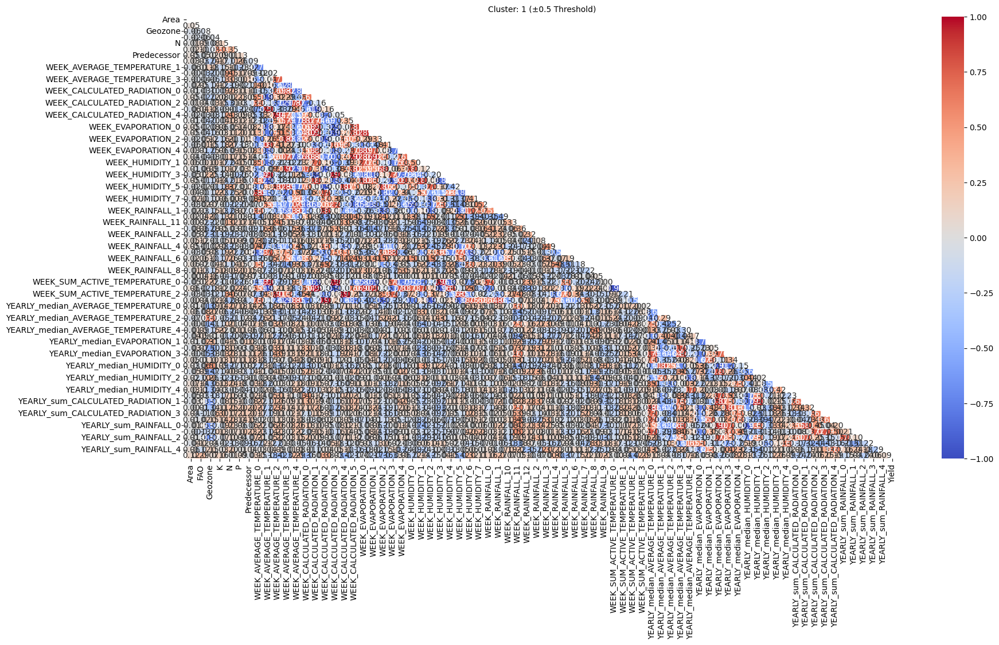

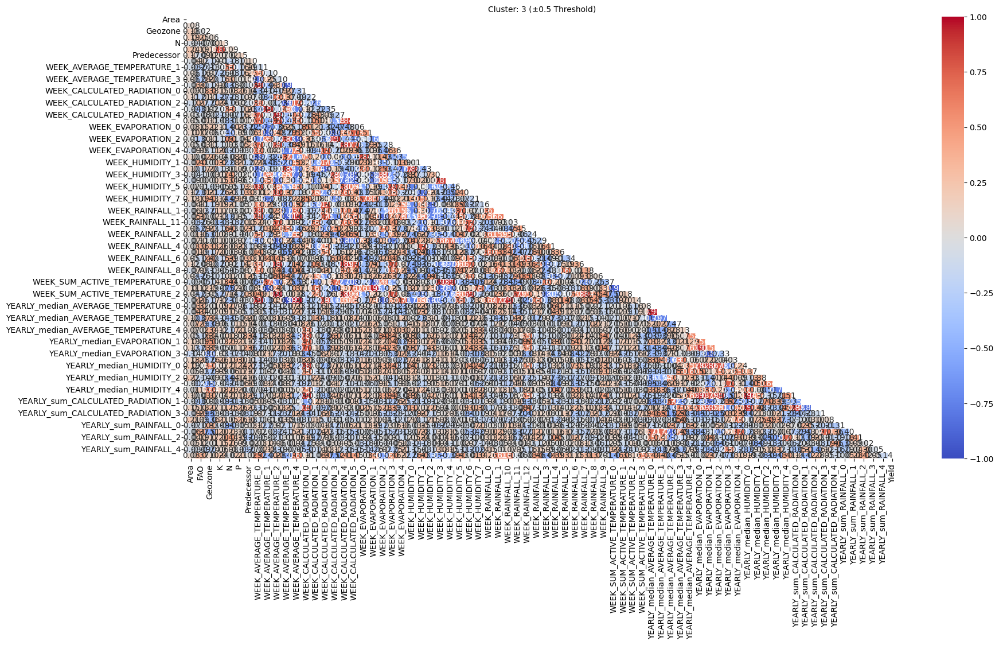

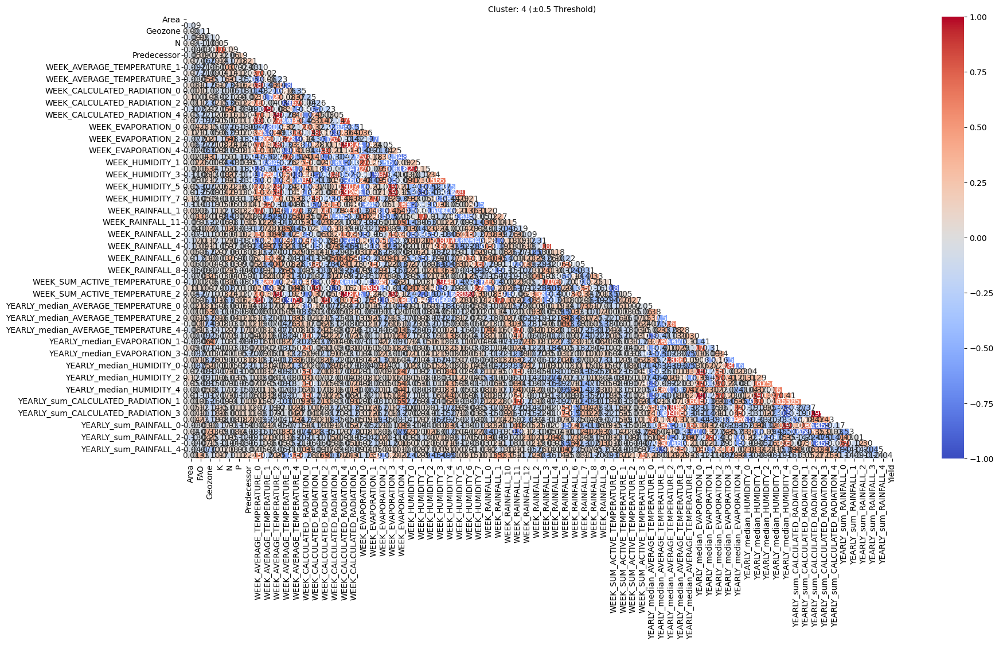

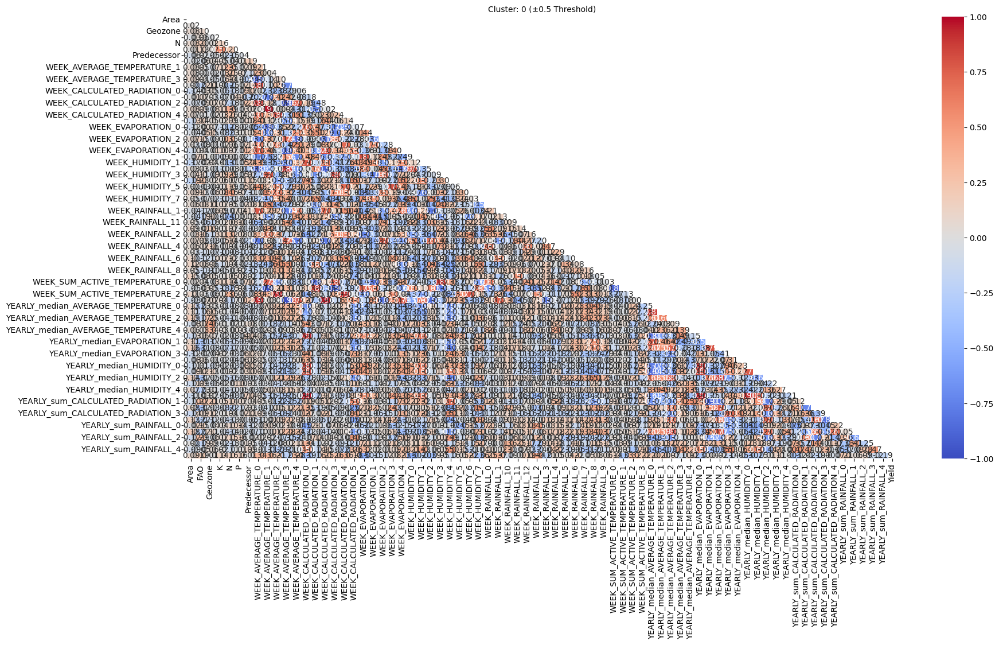

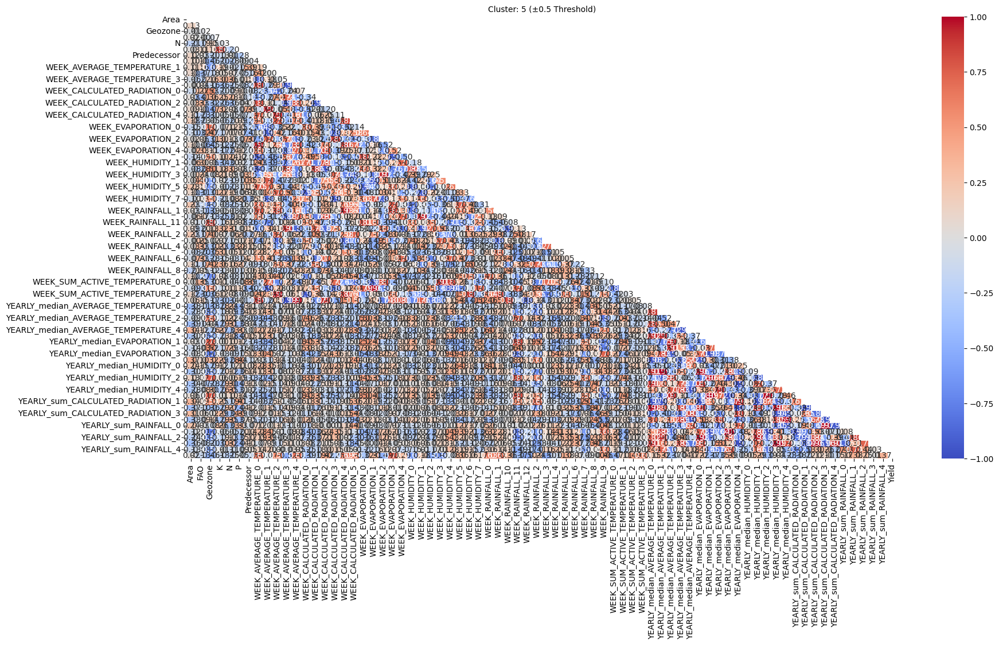

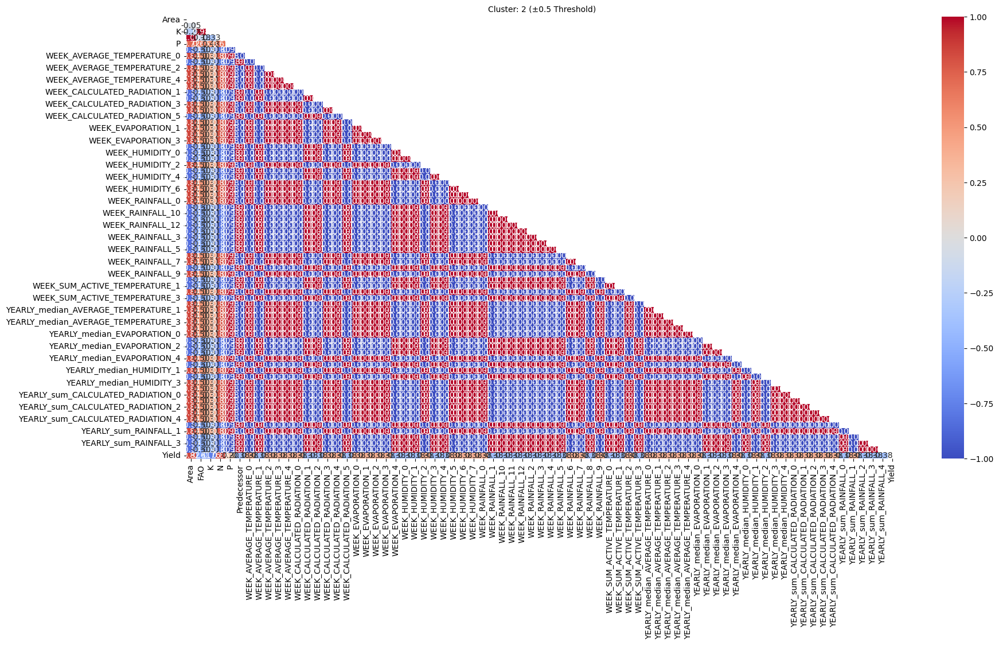

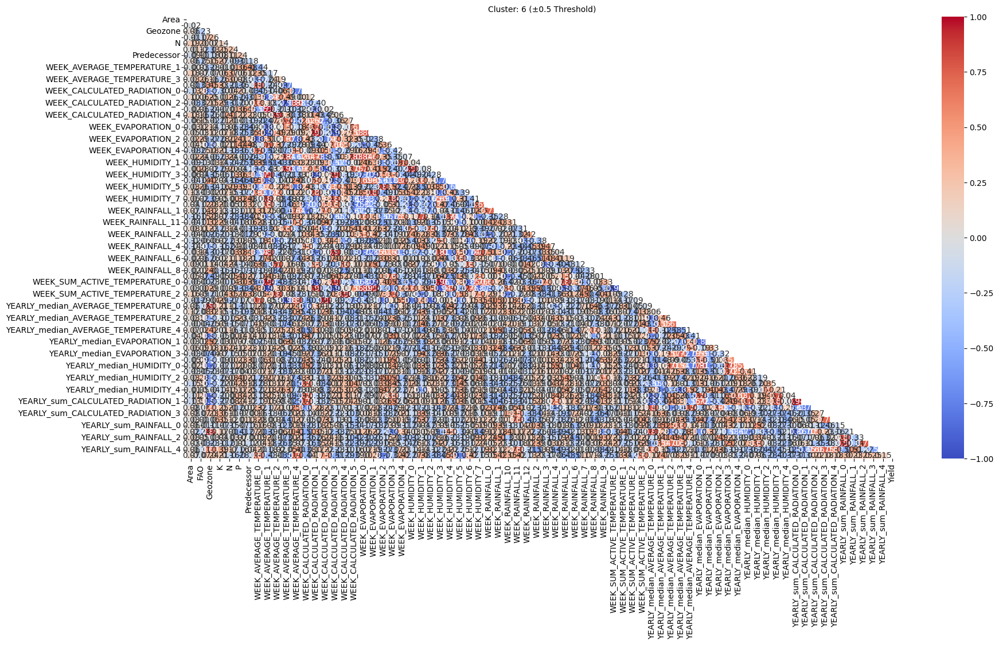

In [21]:
def CorrMatr(df, corr_threshold = 0.0):

    # # calculating the raw correlation matrix
    raw_correlation = df.corr()

    # only keeping the lower diagonal
    correlation = raw_correlation.copy()
    mask = np.zeros_like(correlation, dtype=bool)
    mask[np.triu_indices_from(mask)] = True
    correlation[mask] = np.nan


    # # plotting
    # fig, ax = plt.subplots(figsize=(10, 8))
    # sns.heatmap(correlation, annot=True, cmap='coolwarm', xticklabels=False, yticklabels=False, ax=ax, vmin=-1, vmax=1).set_title('Raw Correlation Heatmap', fontsize=20);

    # function to filter the correlation matrix by features that have correlation values above a certain threshold
    def correlation_threshold_filter(df, threshold):
        passed = set()
        for r, c in combinations(df.columns, 2):
            if (abs(df.loc[r, c]) >= threshold):
                passed.add(r)
                passed.add(c)
        passed = sorted(passed)
        return df.loc[passed, passed]


    correlation = correlation_threshold_filter(raw_correlation, 0.0)

    # only keeping the lower diagonal
    mask = np.zeros_like(correlation, dtype=bool)
    mask[np.triu_indices_from(mask)] = True
    correlation[mask] = np.nan

    return correlation


features = ['Cluster', 'Area', 'Geozone', 'Predecessor', 'FAO', 'N', 'P', 'K']

features = temp_train.columns
print(features)

feature_to_exclude = ['Dataset', 'Field', 'Year', 'Yield']
corr_fetures_list = [item for item in list(features) if item not in feature_to_exclude]



# ax = np.ravel(ax)
# df = train[features + ['Yield']]
for ii in temp_train['Cluster'].unique():
    filtered_df = temp_train.loc[(temp_train['Cluster'] == ii), corr_fetures_list + ['Yield']]

    corr_threshold = 0.5
    correlation = CorrMatr(filtered_df, corr_threshold)

    fig, ax = plt.subplots(1, 1 , figsize=(20, 10))
    sns.heatmap(correlation, annot=True, fmt='0.2f', cmap='coolwarm', ax=ax, vmin=-1, vmax=1).set_title(f'Cluster: {ii} (±{corr_threshold} Threshold)', fontsize=10);

# fig, ax = plt.subplots(2, 4 , figsize=(20, 10))
# ax = np.ravel(ax)
# # df = train[features + ['Yield']]
# for ii in temp_train['Cluster'].unique():
#     filtered_df = temp_train.loc[(temp_train['Cluster'] == ii), corr_fetures_list + ['Yield']]

#     corr_threshold = 0.0
#     correlation = CorrMatr(filtered_df, corr_threshold)

#     sns.heatmap(correlation, annot=True, fmt='0.2f', cmap='coolwarm', ax=ax[ii], vmin=-1, vmax=1).set_title(f'Cluster: {ii} (±{corr_threshold} Threshold)', fontsize=10);


In [22]:
###### CHOSE CLUSTER ##############

# train = train[ train['Cluster'] == 0 ]

################ SPLITTING TRAIN/TEST ###############
target_name = 'Yield'
features_to_exclude = ['Dataset', 'Field', 'Year', 'Yield']
all_features = list(train.columns)
features_to_include = list(set(all_features) - set(features_to_exclude))
print('all_features:', all_features)
print('features_to_include:', features_to_include)
# continuous_features = list(set(continuous_features) - set(features_to_exclude))

# splitting training data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(train[features_to_include],
                                                    train[[target_name]],
                                                    train_size=0.80,
                                                    shuffle=True,
                                                    random_state=1)

print(f'Size of X_train: {X_train.shape}\nSize of y_train: {y_train.shape}')
print(f'Size of X_test: {X_test.shape}\nSize of y_test: {y_test.shape}')

all_features: ['Dataset', 'Field', 'Year', 'Cluster', 'Area', 'Yield', 'Geozone', 'Predecessor', 'FAO', 'N', 'P', 'K', 'WEEK_AVERAGE_TEMPERATURE_0', 'WEEK_AVERAGE_TEMPERATURE_1', 'WEEK_AVERAGE_TEMPERATURE_2', 'WEEK_AVERAGE_TEMPERATURE_3', 'WEEK_AVERAGE_TEMPERATURE_4', 'WEEK_RAINFALL_0', 'WEEK_RAINFALL_1', 'WEEK_RAINFALL_2', 'WEEK_RAINFALL_3', 'WEEK_RAINFALL_4', 'WEEK_RAINFALL_5', 'WEEK_RAINFALL_6', 'WEEK_RAINFALL_7', 'WEEK_RAINFALL_8', 'WEEK_RAINFALL_9', 'WEEK_RAINFALL_10', 'WEEK_RAINFALL_11', 'WEEK_RAINFALL_12', 'WEEK_EVAPORATION_0', 'WEEK_EVAPORATION_1', 'WEEK_EVAPORATION_2', 'WEEK_EVAPORATION_3', 'WEEK_EVAPORATION_4', 'WEEK_HUMIDITY_0', 'WEEK_HUMIDITY_1', 'WEEK_HUMIDITY_2', 'WEEK_HUMIDITY_3', 'WEEK_HUMIDITY_4', 'WEEK_HUMIDITY_5', 'WEEK_HUMIDITY_6', 'WEEK_HUMIDITY_7', 'WEEK_SUM_ACTIVE_TEMPERATURE_0', 'WEEK_SUM_ACTIVE_TEMPERATURE_1', 'WEEK_SUM_ACTIVE_TEMPERATURE_2', 'WEEK_SUM_ACTIVE_TEMPERATURE_3', 'WEEK_CALCULATED_RADIATION_0', 'WEEK_CALCULATED_RADIATION_1', 'WEEK_CALCULATED_RADIATIO

In [23]:
# start with XGBoost
X_baseline = X_train
y_baseline = y_train

# add a dummy feature with random noise to use to assess feature importance
X_baseline['random_noise'] = np.random.normal(size=X_train.shape[0])

# create a baseline model to compare with
baseline_model = XGBRegressor(gamma=5, reg_lambda=5) # quickly add in some regularization by trial and error to prevent extreme overfitting
# cv_results = cross_validate(baseline_model, X_baseline, y_baseline, cv=10, scoring='neg_mean_absolute_error', return_train_score=True)
cv_results = cross_validate(baseline_model, X_baseline, y_baseline, cv=10, scoring='r2', return_train_score=True)
mean_test_score = np.mean(cv_results['test_score'])
train_test_score_rmse = np.sqrt(np.sum((cv_results['test_score'] - cv_results['train_score']) ** 2) / cv_results['test_score'].shape[0]) # helpful for minimizing overfitting

# print scoring metrics
print(f'Test Scores on K-Folds: ' + str(np.round(cv_results['test_score'], decimals=3)))
print(f'Train Scores on K-Folds: ' + str(np.round(cv_results['train_score'], decimals=3)))
print(f'Mean Test Score: {np.round(mean_test_score, decimals=3)}')
print(f'Train/Test Score K-Fold RMSE: {np.round(train_test_score_rmse, decimals=3)}')

Test Scores on K-Folds: [0.689 0.675 0.734 0.707 0.641 0.75  0.741 0.698 0.707 0.705]
Train Scores on K-Folds: [0.971 0.971 0.97  0.974 0.971 0.973 0.974 0.969 0.971 0.969]
Mean Test Score: 0.705
Train/Test Score K-Fold RMSE: 0.269


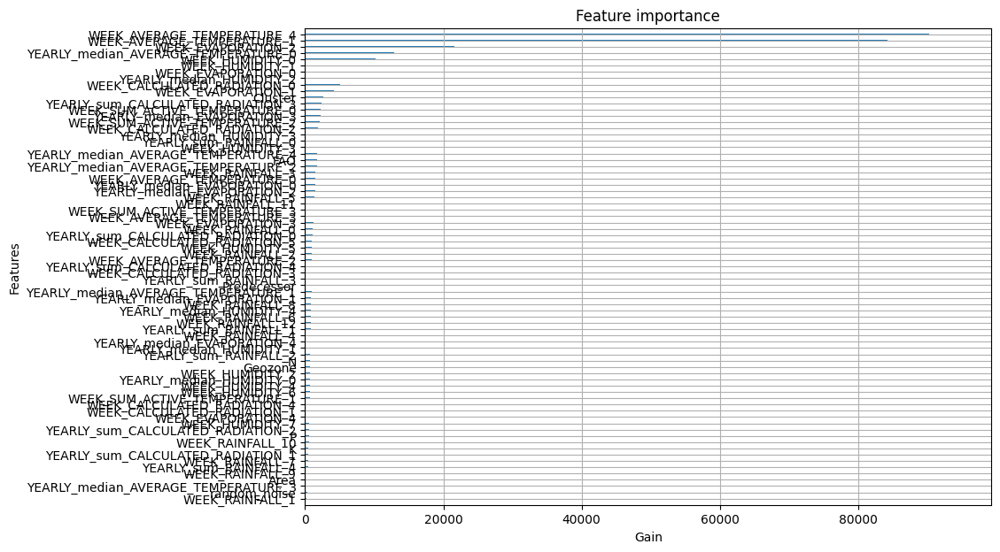

In [24]:
# plotting feature importances
fig, ax = plt.subplots(figsize=(10, 7))
baseline_model.fit(X_baseline, y_baseline)
plot_importance(baseline_model, ax=ax, importance_type='gain', show_values=False, xlabel='Gain', max_num_features=100);

In [25]:
# ####################### ICE ###########################################
# n_cols = 3
# n_rows = int(np.ceil(len(features_to_include) / 3))
# fig, ax = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows))
# ax = np.ravel(ax)
# for i in range(len(ax)): # hiding any unused axes
#     if i >= len(features_to_include):
#         ax[i].set_visible(False)
# ax = ax[0:len(features_to_include)]

# # adding title
# fig.suptitle('Individual Conditional Expectation Plots for Features', fontsize=10);
# fig.tight_layout(pad=3)

# # plot PDP's and ICE's
# PartialDependenceDisplay.from_estimator(baseline_model, X_train, features_to_include, n_cols=n_cols, kind='both', subsample=100, ax=ax)

# # adjusting y-axis values
# for axis in ax:
#     axis.set_ylim([0, 200])

In [26]:
###### DROP FEATURES WITH LOW IMPACT ##################
low_impact_features = ['Yield', 'Dataset', 'Field', 'Year', 'Area', 'N', 'P', 'K']
features_to_exclude = low_impact_features
all_features = list(train.columns)
features_to_include = list(set(all_features) - set(features_to_exclude))

print(low_impact_features, all_features)
print(features_to_include)

X_train, X_test, y_train, y_test = train_test_split(train[features_to_include],
                                                    train[target_name],
                                                    train_size=0.80,
                                                    shuffle=True,
                                                    random_state=1)

print(f'Size of X_train: {X_train.shape}\nSize of y_train: {y_train.shape}')
print(f'Size of X_test: {X_test.shape}\nSize of y_test: {y_test.shape}')

['Yield', 'Dataset', 'Field', 'Year', 'Area', 'N', 'P', 'K'] ['Dataset', 'Field', 'Year', 'Cluster', 'Area', 'Yield', 'Geozone', 'Predecessor', 'FAO', 'N', 'P', 'K', 'WEEK_AVERAGE_TEMPERATURE_0', 'WEEK_AVERAGE_TEMPERATURE_1', 'WEEK_AVERAGE_TEMPERATURE_2', 'WEEK_AVERAGE_TEMPERATURE_3', 'WEEK_AVERAGE_TEMPERATURE_4', 'WEEK_RAINFALL_0', 'WEEK_RAINFALL_1', 'WEEK_RAINFALL_2', 'WEEK_RAINFALL_3', 'WEEK_RAINFALL_4', 'WEEK_RAINFALL_5', 'WEEK_RAINFALL_6', 'WEEK_RAINFALL_7', 'WEEK_RAINFALL_8', 'WEEK_RAINFALL_9', 'WEEK_RAINFALL_10', 'WEEK_RAINFALL_11', 'WEEK_RAINFALL_12', 'WEEK_EVAPORATION_0', 'WEEK_EVAPORATION_1', 'WEEK_EVAPORATION_2', 'WEEK_EVAPORATION_3', 'WEEK_EVAPORATION_4', 'WEEK_HUMIDITY_0', 'WEEK_HUMIDITY_1', 'WEEK_HUMIDITY_2', 'WEEK_HUMIDITY_3', 'WEEK_HUMIDITY_4', 'WEEK_HUMIDITY_5', 'WEEK_HUMIDITY_6', 'WEEK_HUMIDITY_7', 'WEEK_SUM_ACTIVE_TEMPERATURE_0', 'WEEK_SUM_ACTIVE_TEMPERATURE_1', 'WEEK_SUM_ACTIVE_TEMPERATURE_2', 'WEEK_SUM_ACTIVE_TEMPERATURE_3', 'WEEK_CALCULATED_RADIATION_0', 'WEEK_CAL

In [27]:
# get train and test data
X_baseline = X_train
y_baseline = y_train

# analyze baseline model with refined data
# cv_results = cross_validate(baseline_model, X_baseline, y_baseline, cv=10, scoring='neg_mean_absolute_error', return_train_score=True)
cv_results = cross_validate(baseline_model, X_baseline, y_baseline, cv=10, scoring='r2', return_train_score=True)
mean_test_score = np.mean(cv_results['test_score'])
train_test_score_rmse = np.sqrt(np.sum((cv_results['test_score'] - cv_results['train_score']) ** 2) / cv_results['test_score'].shape[0]) # helpful for minimizing overfitting

# print scoring metrics
print('Test Scores on K-Folds: ' + str(np.round(cv_results['test_score'], decimals=3)))
print('Train Scores on K-Folds: ' + str(np.round(cv_results['train_score'], decimals=3)))
print(f'Mean Test Score: {np.round(mean_test_score, decimals=3)}')
print(f'Train/Test Score K-Fold RMSE: {np.round(train_test_score_rmse, decimals=3)}')

Test Scores on K-Folds: [0.756 0.709 0.744 0.728 0.679 0.765 0.743 0.707 0.738 0.764]
Train Scores on K-Folds: [0.858 0.857 0.856 0.859 0.862 0.854 0.858 0.858 0.859 0.854]
Mean Test Score: 0.733
Train/Test Score K-Fold RMSE: 0.127


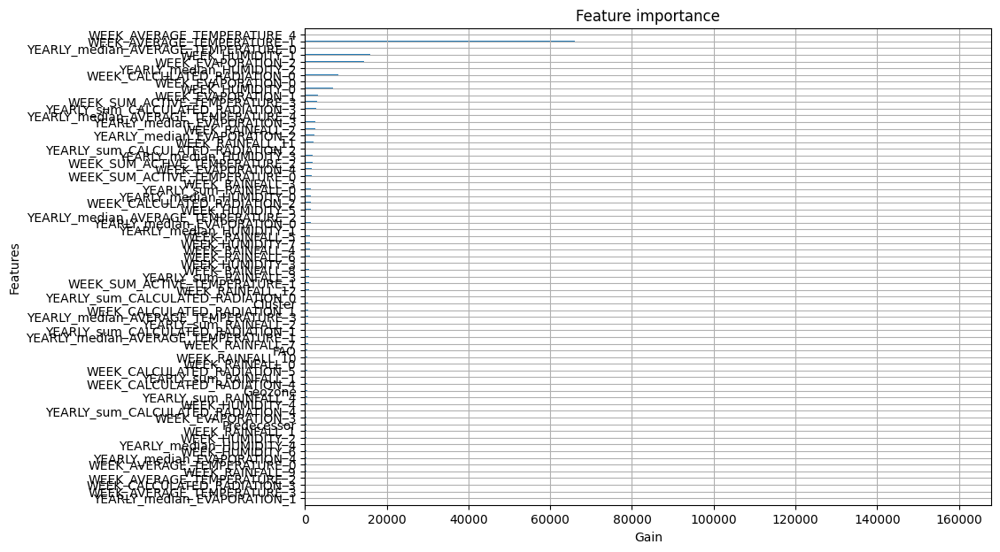

In [28]:
# plotting feature importances
fig, ax = plt.subplots(figsize=(10, 7))
baseline_model.fit(X_baseline, y_baseline)
plot_importance(baseline_model, ax=ax, importance_type='gain', show_values=False, xlabel='Gain', max_num_features=100);

In [29]:
######################## CATBOOST PROBE ###################
cb_model = CatBoostRegressor(iterations=200, silent=True)
cv_results = cross_validate(cb_model, X_baseline, y_baseline, cv=10, scoring='r2', return_train_score=True)
mean_test_score = np.mean(cv_results['test_score'])
train_test_score_rmse = np.sqrt(np.sum((cv_results['test_score'] - cv_results['train_score']) ** 2) / cv_results['test_score'].shape[0]) # helpful for minimizing overfitting

# print scoring metrics
print('Test Scores on K-Folds: ' + str(np.round(cv_results['test_score'], decimals=3)))
print('Train Scores on K-Folds: ' + str(np.round(cv_results['train_score'], decimals=3)))
print(f'Mean Test Score: {np.round(mean_test_score, decimals=3)}')
print(f'Train/Test Score K-Fold RMSE: {np.round(train_test_score_rmse, decimals=3)}')

Test Scores on K-Folds: [0.753 0.716 0.748 0.735 0.673 0.755 0.747 0.703 0.734 0.756]
Train Scores on K-Folds: [0.823 0.826 0.823 0.825 0.827 0.822 0.822 0.823 0.824 0.826]
Mean Test Score: 0.732
Train/Test Score K-Fold RMSE: 0.096


In [ ]:
# optimize XGBoost hyperparameters with optuna
def objective(trial):
    # create the regressor object
    regressor = XGBRegressor(n_estimators=trial.suggest_int('n_estimators', 70, 1000),
                             max_depth=trial.suggest_int('max_depth', 2, 10),
                             min_child_weight=trial.suggest_float('min_child_weight', 0, 6),
                             gamma=trial.suggest_float('gamma', 0, 6),
                             learning_rate=trial.suggest_float('learning_rate', 0.001, 0.3),
                             subsample=trial.suggest_float('subsample', 0.50, 1),
                             colsample_bytree=trial.suggest_float('colsample_bytree', 0.5, 1),
                             reg_lambda=trial.suggest_float('reg_lambda', 0, 5))

    train_scores = []
    test_scores = []

    cv_results = cross_validate(regressor, X_train, y_train, cv=10, scoring='r2', return_train_score=True)
    mean_test_score = np.mean(cv_results['test_score'])
    train_test_score_rmse = np.sqrt(np.sum((cv_results['test_score'] - cv_results['train_score']) ** 2) / cv_results['test_score'].shape[0]) # helpful for minimizing overfitting

    return mean_test_score, train_test_score_rmse

optuna.logging.set_verbosity(optuna.logging.WARNING)
cv_study = optuna.create_study(directions=['maximize', 'minimize'])
cv_study.optimize(objective, n_trials=20)

study_results_zipped = [(hyper.values[0], hyper.values[1], hyper.params) for hyper in cv_study.best_trials]
ordered_study_results = sorted(study_results_zipped, key=lambda x: x[1])

min_max_list = []

for i, hyper in enumerate(ordered_study_results):
    print(f'Model {i} Results:')
    print(f'Mean Test Score: {np.round(hyper[0], decimals=3)}\nTrain/Test Score K-Fold RMSE: {np.round(hyper[1], decimals=3)}')
    print(hyper[2])
    print('\n')

    min_max_list.append(np.round(hyper[0], decimals=3))

print(min_max_list)

fn


In [ ]:
# create the XGBoost object
xgb_final = XGBRegressor(n_estimators=368,
                         max_depth=4,
                         min_child_weight=4.899,
                         gamma=5.124,
                         learning_rate=0.02783,
                         subsample=0.625,
                         colsample_bytree=0.922,
                         reg_lambda=3.644)

# begin cross-validation
cv_results = cross_validate(xgb_final, X_train, y_train, cv=10, scoring='r2', return_train_score=True)
mean_test_score = np.mean(cv_results['test_score'])
train_test_score_rmse = np.sqrt(np.sum((cv_results['test_score'] - cv_results['train_score']) ** 2) / cv_results['test_score'].shape[0]) # helpful for minimizing overfitting

# print scoring metrics
print('Test Scores on K-Folds: ' + str(np.round(cv_results['test_score'], decimals=3)))
print('Train Scores on K-Folds: ' + str(np.round(cv_results['train_score'], decimals=3)))
print(f'Mean Test Score: {np.round(mean_test_score, decimals=3)}')
print(f'Train/Test Score K-Fold RMSE: {np.round(train_test_score_rmse, decimals=3)}')

In [ ]:
# optimize CatBoost hyperparameters with optuna
def objective(trial):
    # create the regressor object
    regressor = CatBoostRegressor(iterations=trial.suggest_int('iterations', 100, 800),
                                  depth=trial.suggest_int('depth', 6, 10),
                                  l2_leaf_reg=trial.suggest_float('l2_leaf_reg', 0.0001, 0.1, log=True),
                                  silent=True)

    # create lists to store scores
    train_scores = []
    test_scores = []

    # begin cross-validation
    cv_results = cross_validate(regressor, X_train, y_train, cv=10, scoring='r2', return_train_score=True)
    mean_test_score = np.mean(cv_results['test_score'])
    train_test_score_rmse = np.sqrt(np.sum((cv_results['test_score'] - cv_results['train_score']) ** 2) / cv_results['test_score'].shape[0]) # helpful for minimizing overfitting

    return mean_test_score, train_test_score_rmse

# begin optimization
optuna.logging.set_verbosity(optuna.logging.WARNING) # won't print progress for every single trial
cv_study = optuna.create_study(directions=['maximize', 'minimize'])
cv_study.optimize(objective, n_trials=20)

# print the Pareto-Optimal results
study_results_zipped = [(hyper.values[0], hyper.values[1], hyper.params) for hyper in cv_study.best_trials]
ordered_study_results = sorted(study_results_zipped, key=lambda x: x[1])
for i, hyper in enumerate(ordered_study_results):
    print(f'Pareto Model {i} Results:')
    print(f'Mean Test Score: {np.round(hyper[0], decimals=3)}\nTrain/Test MAE K-Fold Score: {np.round(hyper[1], decimals=3)}')
    print(hyper[2])
    print('\n')

In [ ]:
# create a CatBoost object
cb_final = CatBoostRegressor(iterations=320,
                             depth=6,
                             l2_leaf_reg=0.0188877,
                             silent=True)

cv_results = cross_validate(cb_final, X_baseline, y_baseline, cv=10, scoring='r2', return_train_score=True)
mean_test_score = np.mean(cv_results['test_score'])
train_test_score_rmse = np.sqrt(np.sum((cv_results['test_score'] - cv_results['train_score']) ** 2) / cv_results['test_score'].shape[0]) # helpful for minimizing overfitting

# print scoring metrics
print('Test Scores on K-Folds: ' + str(np.round(cv_results['test_score'], decimals=3)))
print('Train Scores on K-Folds: ' + str(np.round(cv_results['train_score'], decimals=3)))
print(f'Mean Test Score: {np.round(mean_test_score, decimals=3)}')
print(f'Train/Test Score K-Fold RMSE: {np.round(train_test_score_rmse, decimals=3)}')

In [ ]:
# creating a voting ensemble from the three models
voting_model = VotingRegressor(estimators=[('xgb', xgb_final), ('cb', cb_final)])

# begin cross-validation
cv_results = cross_validate(voting_model, X_train, y_train, cv=10, scoring='r2', return_train_score=True)
mean_test_score = np.mean(cv_results['test_score'])
train_test_score_rmse = np.sqrt(np.sum((cv_results['test_score'] - cv_results['train_score']) ** 2) / cv_results['test_score'].shape[0]) # helpful for minimizing overfitting

# print scoring metrics
print('Test Scores on K-Folds: ' + str(np.round(cv_results['test_score'], decimals=3)))
print('Train Scores on K-Folds: ' + str(np.round(cv_results['train_score'], decimals=3)))
print(f'Mean Test Score: {np.round(mean_test_score, decimals=3)}')
print(f'Train/Test Score K-Fold RMSE: {np.round(train_test_score_rmse, decimals=3)}')

In [ ]:
# creating a stacked ensemble from the three models
stacked_model = StackingRegressor(estimators=[('xgb', xgb_final), ('cb', cb_final)], final_estimator=LinearRegression())

# begin cross-validation
cv_results = cross_validate(stacked_model, X_train, y_train, cv=10, scoring='r2', return_train_score=True)
mean_test_score = np.mean(cv_results['test_score'])
train_test_score_rmse = np.sqrt(np.sum((cv_results['test_score'] - cv_results['train_score']) ** 2) / cv_results['test_score'].shape[0]) # helpful for minimizing overfitting

# print scoring metrics
print('Test Scores on K-Folds: ' + str(np.round(cv_results['test_score'], decimals=3)))
print('Train Scores on K-Folds: ' + str(np.round(cv_results['train_score'], decimals=3)))
print(f'Mean Test Score: {np.round(mean_test_score, decimals=3)}')
print(f'Train/Test Score K-Fold RMSE: {np.round(train_test_score_rmse, decimals=3)}')

In [ ]:
# fit the pipeline to the training data and report score on test data
stacked_model.fit(X_train, y_train)

y_test_pred = stacked_model.predict(X_test)

model_score = mean_absolute_error(y_test, y_test_pred)
print(f'Test Data Score: {np.round(model_score, decimals=3)}')

In [ ]:
# create a partial dependence plot figure
n_cols = 3
n_rows = int(np.ceil(len(features_to_include) / 3))
fig, ax = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows))
ax = np.ravel(ax)
for i in range(len(ax)): # hiding any unused axes
    if i >= len(features_to_include):
        ax[i].set_visible(False)
ax = ax[0:len(features_to_include)]

fig.suptitle('Individual Conditional Expectation Plots for Features', fontsize=10);
fig.tight_layout(pad=3)

PartialDependenceDisplay.from_estimator(stacked_model, X_train, features_to_include, n_cols=n_cols, kind='both', subsample=100, ax=ax)

for axis in ax:
    axis.set_ylim([0, 200])

In [ ]:
fn

In [ ]:
Field = train['Field'].unique()
Year = train['Year'].unique()
Clusters = train['Cluster'].unique()
# Area = train['Area'].unique()
Geozone = train['Geozone'].unique()
Predecessor = train['Predecessor'].unique()
FAO = train['FAO'].unique()

print('Field:', len(Field), Field)
print('Year:', Year)
print('Clusters:', Clusters)
# print('Area:', Area)
print('Geozone:', len(Geozone), Geozone)
print('Predecessor:', Predecessor)
print('FAO:', FAO)

# train_clusters_list = []

# for ii in train['Cluster'].unique():
#   df = train[ train['Cluster'] == ii ]
#   train_clusters_list.append(df)

# train_clusters_list[0]





In [ ]:
#correlation between variables
#heat map

df =

import seaborn as sns
import matplotlib.pyplot as plt
fig,ax=plt.subplots(1,1,figsize=(20,12))
sns.heatmap(train.corr(),annot=False,linewidths=1)
plt.show()